### Assess the performance of Cell2Spatial using mouse kindney ST dataset.
- Author: Huamei Li
- Date: 2023-09-13
- Email: li_hua_mei@163.com
- Institute: Nanjing University

In [2]:
options(warn = -1)
suppressMessages(require(Seurat))
suppressMessages(require(ggplot2))
suppressMessages(require(dplyr))
suppressMessages(require(reticulate))
suppressMessages(require(stringr))
suppressMessages(require(ggpubr))
suppressMessages(require(tidydr))
suppressMessages(require(CellTrek))
suppressMessages(require(CARD))
devtools::load_all('../Cell2Spatial/')

ℹ Loading Cell2Spatial


In [107]:
source('modules/globalParams.R')
source('modules/utils.R')
source('modules/vis.R')
source('modules/reformatProjRes.R')

In [108]:
out.figs.dir <- '../2.results/Mouse.kidney/figs'
out.data.dir <- '../2.results/Mouse.kidney/data'

In [109]:
dir.create(out.figs.dir, showWarnings = FALSE, recursive = TRUE)
dir.create(out.data.dir, showWarnings = FALSE, recursive = TRUE)

In [110]:
MTH_COLOR <- c(
    'Reference'    = 'grey',
    'Cell2Spatial' = '#F7B263',
    'CytoSPACE' = '#D6AA8E',
    'CellTrek' = '#99C0CC',
    'Tangram' = 'lightgreen',
    'Seurat' = '#CC00FF'
)

### Loading kidney ST and SC datasets 

In [1]:
brain.st <- readRDS('../0.data/Mouse.kidney/Kindney_SP2.RDS')

In [3]:
brain.st

An object of class Seurat 
31053 features across 1835 samples within 1 assay 
Active assay: Spatial (31053 features, 0 variable features)
 2 layers present: counts, data
 1 image present: slice1

In [6]:
sum(GetAssayData(brain.st, slot = 'count')>0)
sum(GetAssayData(brain.st, slot = 'count')==0)
46731849 / (10250406 + 46731849)

[1] 10250406

[1] 46731849

[1] 0.8201123

In [7]:
max(colSums(GetAssayData(brain.st, slot = 'count')))
median(colSums(GetAssayData(brain.st, slot = 'count')))

[1] 74120

[1] 34439

In [8]:
brain.sc <- readRDS('../0.data/Mouse.kidney/Kindney_SC.RDS')

In [11]:
brain.sc

An object of class Seurat 
19125 features across 12987 samples within 1 assay 
Active assay: RNA (19125 features, 0 variable features)
 2 layers present: counts, data

In [135]:
brain.st <- brain.st %>% SCTransform(., verbose = FALSE, assay = 'Spatial') %>%
    RunPCA(verbose = FALSE) %>%
    RunUMAP(dims = 1 : 30, verbose = FALSE) %>%
    FindNeighbors(., dims = 1:30, verbose = FALSE, res = 0.5) %>%
    FindClusters(., verbose = FALSE)

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’



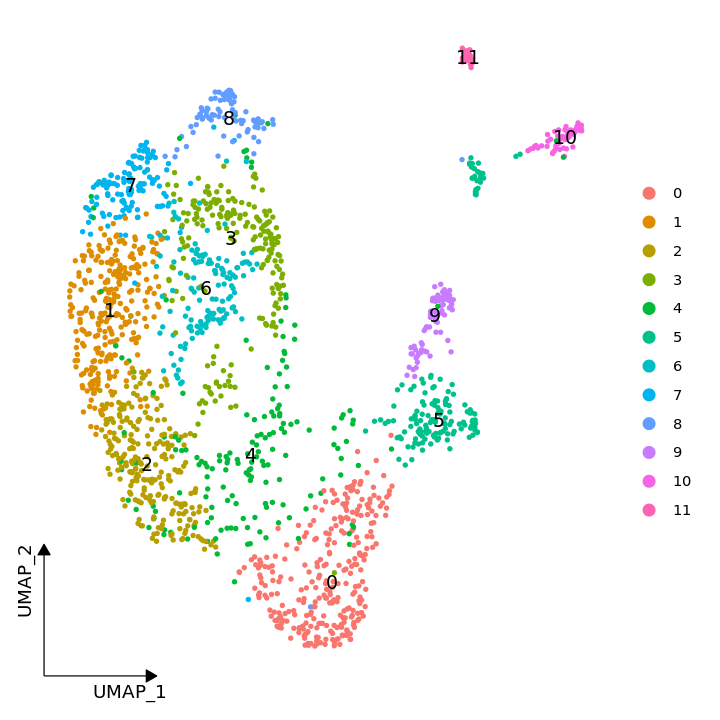

In [136]:
options(repr.plot.width = 6, repr.plot.height = 6)
DimPlot(brain.st, reduction = "umap", label = TRUE) + theme_dr(xlength = 0.2, ylength = 0.2, arrow = grid::arrow(length = unit(0.1, "inches"), ends = 'last', type = "closed")) + theme(panel.grid = element_blank())
ggsave(file.path(out.figs.dir, 'Kindney.ST.cluster.UMAP.dimplot.pdf'), width = 6, height = 6)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


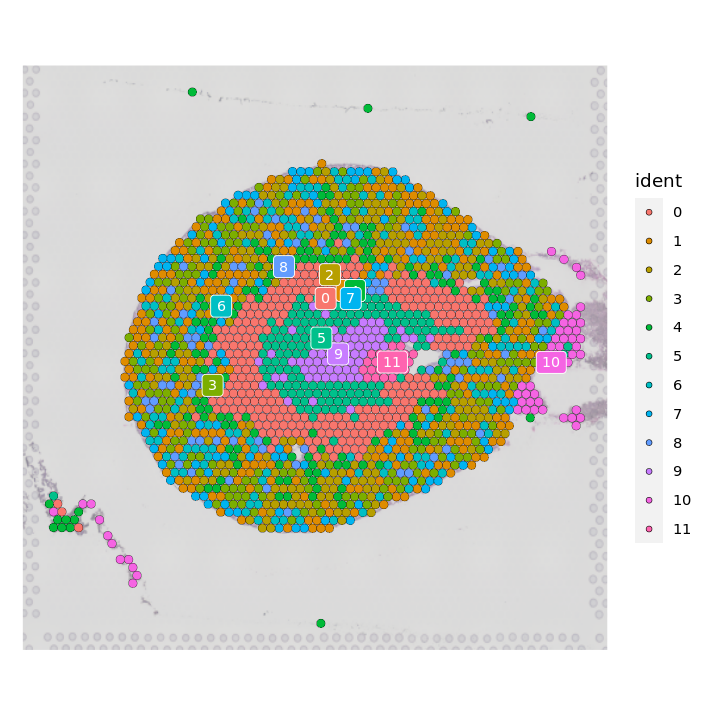

In [137]:
options(repr.plot.width = 6, repr.plot.height = 6)
SpatialDimPlot(brain.st, label = TRUE, label.size = 3, image.alpha = 0.5)
ggsave(file.path(out.figs.dir, 'brain.ST.cluster.UMAP.spatial.pdf'), width = 6, height = 6)

In [138]:
f.ctypes <- levels(brain.st)
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(brain.st, idents = ct) %>% Cells
    SpatialPlot(brain.st, cells.highlight = h.cells) + NoLegend() + ggtitle(ct) 
})

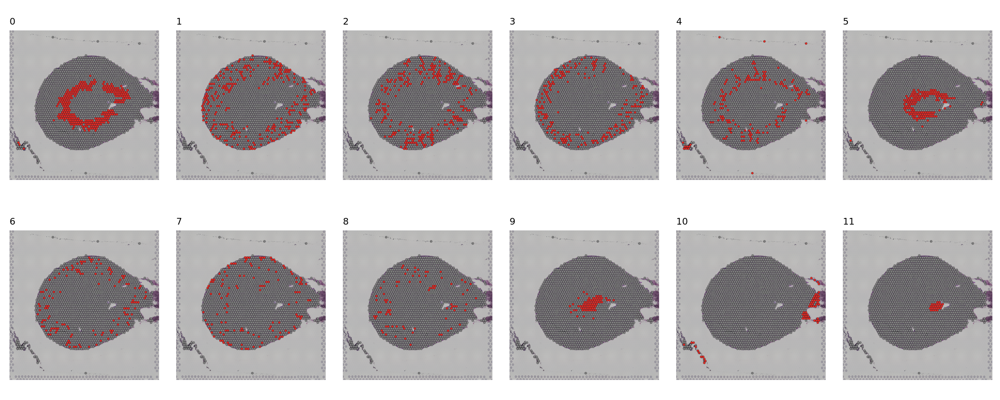

In [139]:
options(repr.plot.width = 20, repr.plot.height = 8)
ggarrange(plotlist = gps, nrow = 2, ncol = 6)

ggsave(file.path(out.figs.dir, 'brain.ST.UMAP.split.spatial.pdf'), width = 20, height = 8)

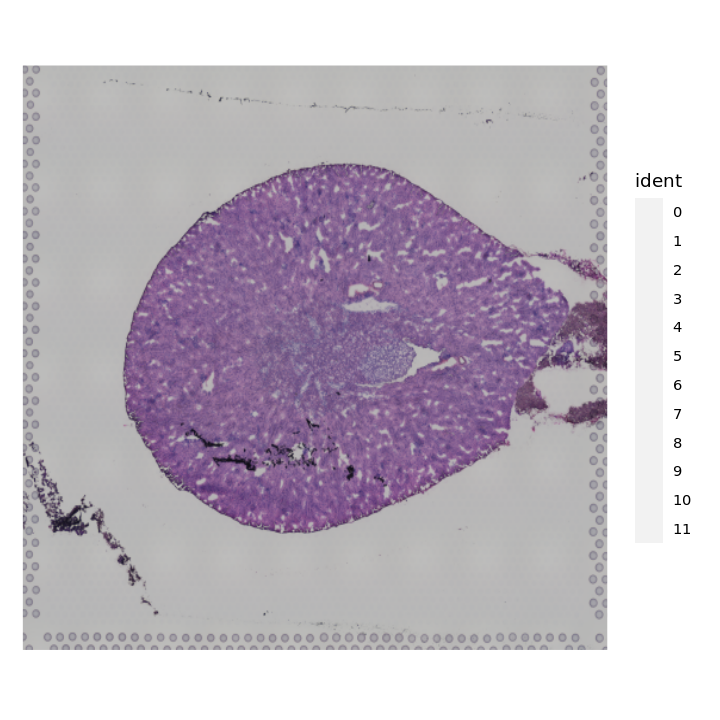

In [140]:
options(repr.plot.width = 6, repr.plot.height = 6)
SpatialDimPlot(brain.st, label = FALSE, label.size = 3,, alpha = 0)
ggsave(file.path(out.figs.dir, 'brain.ST.Image.spatial.pdf'), width = 6, height = 6)

In [141]:
brain.sc@meta.data %>% head

,orig.ident,nCount_RNA,nFeature_RNA,nGene,nUMI,replicate,percent.mito,sex,res.1,Lineages,Ontology_ID,mainCtype,Zone
,<fct>,<dbl>,<int>,<int>,<dbl>,<fct>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<chr>
Z1_F_F1_AAACCTGAGGGCTTCC,Z1,2379.456,1633,1633,4752,F1,0.22790404,F,10,Nephron epithelium,5,ProxTub,Cortex
Z1_F_F1_AAACGGGAGGCGACAT,Z1,2754.327,2079,2079,6079,F1,0.03750617,F,12,Nephron epithelium,18,DistTub,Cortex
Z1_F_F1_AAAGATGCAGCCTATA,Z1,2555.799,2121,2122,8175,F1,0.20271593,F,10,Nephron epithelium,5,ProxTub,Cortex
Z1_F_F1_AAAGATGCAGCGAACA,Z1,3108.159,2751,2751,8799,F1,0.03954995,F,12,Nephron epithelium,18,DistTub,Cortex
Z1_F_F1_AAAGATGTCTGATTCT,Z1,2799.285,2291,2291,7572,F1,0.12836767,F,10,Nephron epithelium,5,ProxTub,Cortex
Z1_F_F1_AAAGCAAAGGCGCTCT,Z1,2995.873,2066,2066,4527,F1,0.09277667,F,20,Ureteric epithelium,20,UNKNOW,Cortex


In [9]:
Idents(brain.sc) <- brain.sc$mainCtype

In [10]:
unique(brain.sc$mainCtype)

[1] ProxTub  DistTub  UNKNOW   RenaCorp Inter    Prin     TLLH    
14 Levels: Macro Vascular ProxTub Prin DistTub TLLH T VSMC B Inter ... Fb

In [143]:
brain.sc <- SCTransform(brain.sc, ncells = 3000, verbose = FALSE) %>%
    RunPCA(verbose = FALSE) %>%
    RunUMAP(dims = 1 : 30, verbose = FALSE)

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’



In [144]:
set.seed(2023063) 
#cell.colors <- randomcoloR::distinctColorPalette(length(unique(brain.sc$ )))  %>% `names<-`(unique(brain.sc$mainCtype))

In [145]:
cell.colors <- c('19' = '#352A85', '18' = '#343197', '3' = '#343AAB', '4' = '#343AAB', '20' = '#1F4BC2', '21' = '#065DDA', 
    '22' = '#076EDB', '17' = '#0F82D3', '1' = '#1A95C4', '2' = '#25ACAD', '5' = '#48B894', '6' = '#48B894', '23' = '#81BA79',
    '24' = '#B3BC62', '16' = '#FFEF4A', '7' = '#FFE03B', '8' = '#FFE03B', '25' = '#FFD22C', '9A' = '#FFC31E', '9B' = '#FFB40F',
    '26' = '#FFA400', '15' = '#FF9500', '10' = '#FF8600', '27' = '#FF7800', '28' = '#FF6900', '29' = '#FF5A00', '11' = '#EF4A00',
    '30' = '#E03B00', '31' = '#D22C00', '13' = '#C31E00', '32' = '#B40F00'
)

In [19]:
#options(repr.plot.width = 6, repr.plot.height = 6)
#DimPlot(brain.sc, label = TRUE, cols = cell.colors) + theme_dr(xlength = 0.2, ylength = 0.2, arrow = grid::arrow(length = unit(0.1, "inches"), ends = 'last', type = "closed")) + theme(panel.grid = element_blank()) + NoLegend()
#ggsave(file.path(out.figs.dir, 'brain.SC.cluster.UMAP.dimplot.pdf'), width = 6, height = 6)

In [20]:
#markers <- FindAllMarkers(brain.st, only.pos = TRUE, logfc.threshold = 0.25, min.pct = 0.25, assay = 'SCT')

In [21]:
#openxlsx::write.xlsx(markers, file = file.path(out.data.dir, 'Mouse.Kidney.ST.markers.xlsx'))

In [22]:
#top20.markers <- markers %>% group_by(cluster) %>% top_n(n = 20, wt = avg_log2FC)

In [22]:
#saveRDS(brain.sc, file = file.path(out.data.dir, 'brain.sc.RDS'))
#saveRDS(brain.st, file = file.path(out.data.dir, 'brain.st.RDS'))

In [146]:
zone.colors <- c(`Cortex` = '#EDADED', `Outer stripe` = '#0D0786', `Inner stripe` = '#EC7952', `Inner medulla` = '#FCE724')

In [147]:
dim(brain.sc)

[1] 17107 12987

In [148]:
levels(brain.sc)

[1] "ProxTub"  "Prin"     "DistTub"  "TLLH"     "Inter"    "UNKNOW"   "RenaCorp"

### Showing the projection performance for Cell2Spatial

In [293]:
cell2spatial <- readRDS('../2.results/Mouse.kidney//data//kidney.cell2spatial.Zone.RDS')$obj

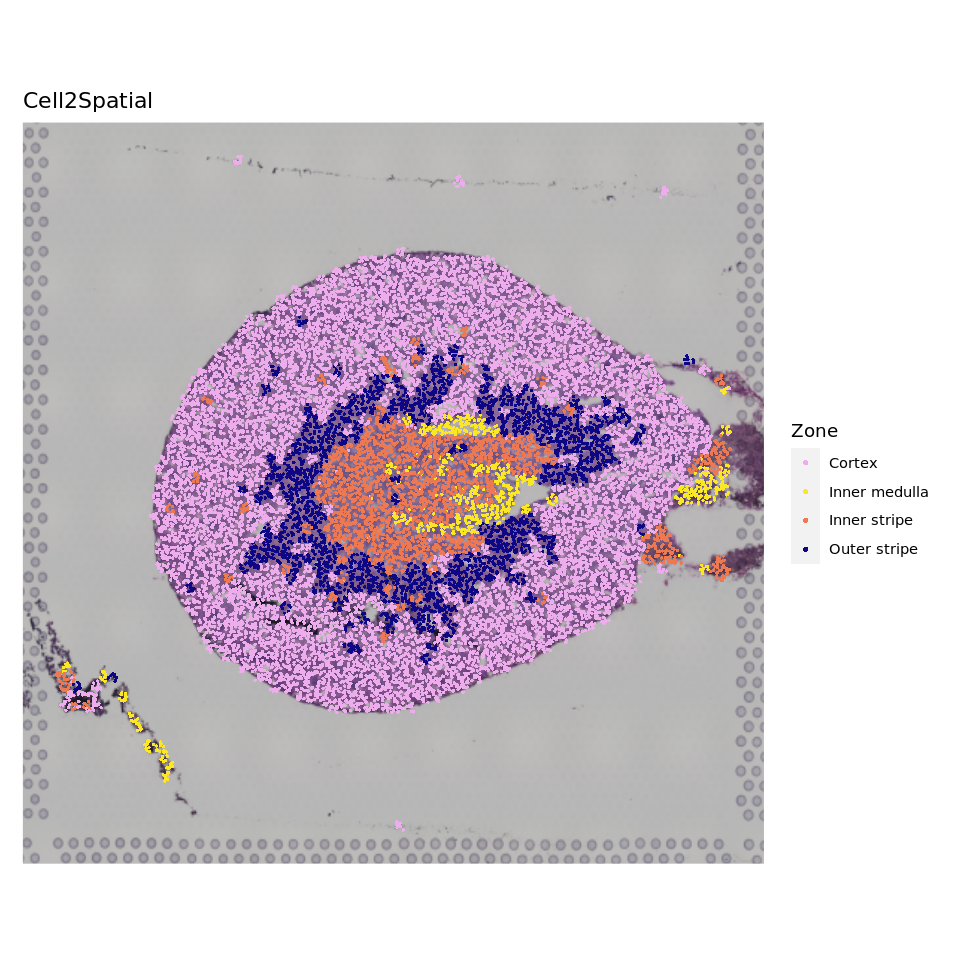

In [295]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(cell2spatial, group.by = 'Zone', pt.size = 0.5, image.alpha = 1, stroke = NA, cols = zone.colors) + ggtitle('Cell2Spatial')
ggsave(file.path(out.figs.dir, 'cell2spatial.entire.UMAP.pdf'), width = 8, height = 6)

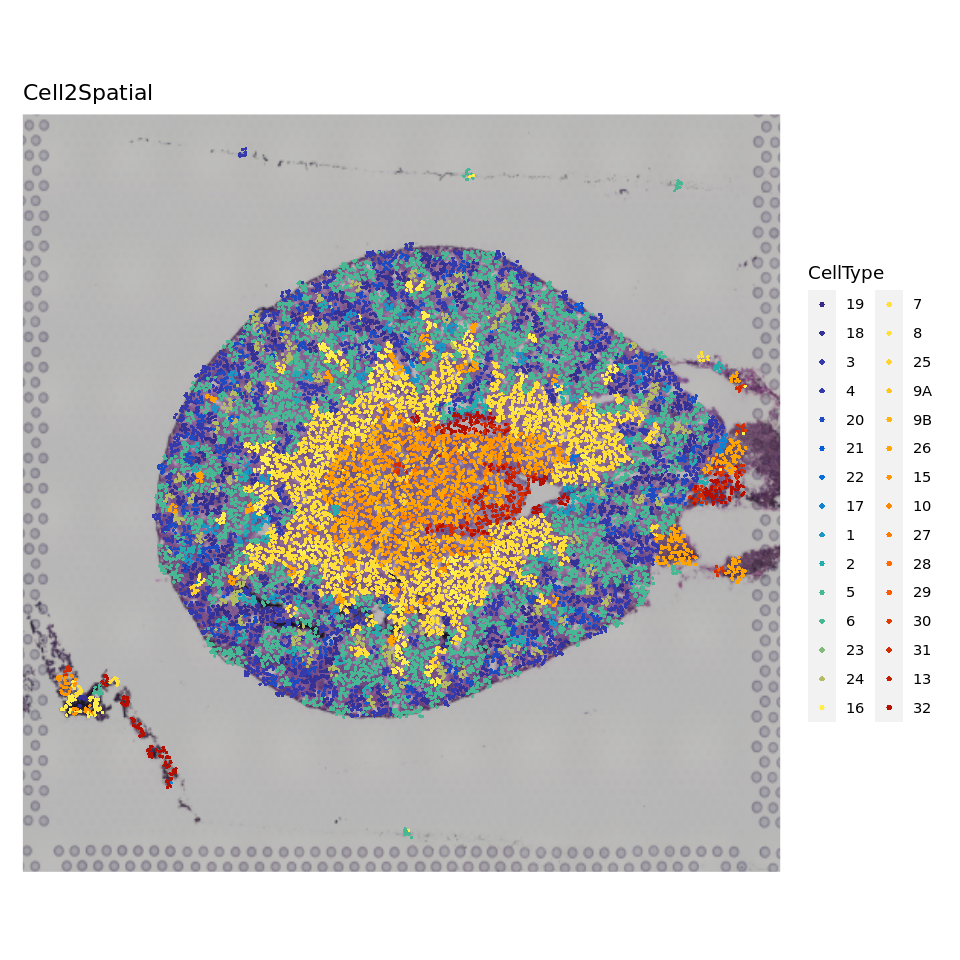

In [296]:
options(repr.plot.width = 8, repr.plot.height = 8)
cell2spatial$CellType <- factor(cell2spatial$CellType, levels = names(cell.colors))
SpatialPlot(cell2spatial, group.by = 'CellType', pt.size = 0.5, image.alpha = 1, stroke = NA, cols = alpha(cell.colors, rep(0.1, length(cell.colors)))) + ggtitle('Cell2Spatial')
ggsave(file.path(out.figs.dir, 'cell2spatial.entire.celltype.UMAP.pdf'), width = 8, height = 6)

In [462]:
f.ctypes <- cell2spatial$Zone %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(cell2spatial, Zone == ct) %>% Cells
    obj.sub <- cell2spatial[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 0.5, group.by = 'Zone',  pt.size.factor = 1, crop = FALSE, stroke = 0) + ggtitle(ct) + NoLegend()  
})

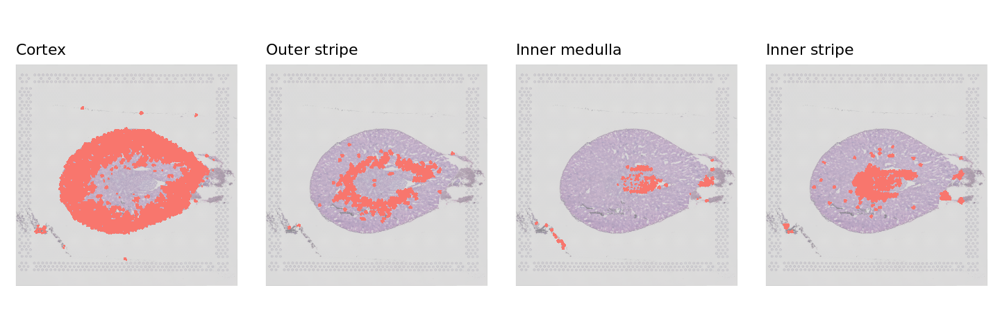

In [463]:
options(repr.plot.width = 12, repr.plot.height = 4)
ggarrange(plotlist = gps, nrow = 1, ncol = 4)
ggsave(file.path(out.figs.dir, 'cell2spatial.split.UMAP.pdf'), width = 12, height = 4)
ggsave(file.path(out.figs.dir, 'cell2spatial.split.UMAP.eps'), width = 12, height = 4)

In [464]:
f.ctypes <- cell2spatial$Ontology_ID %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(cell2spatial, Ontology_ID == ct) %>% Cells
    obj.sub <- cell2spatial[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 0.5, group.by = 'Ontology_ID',  pt.size.factor = 1, crop = FALSE, stroke = 0) + ggtitle(ct) + NoLegend()  
})

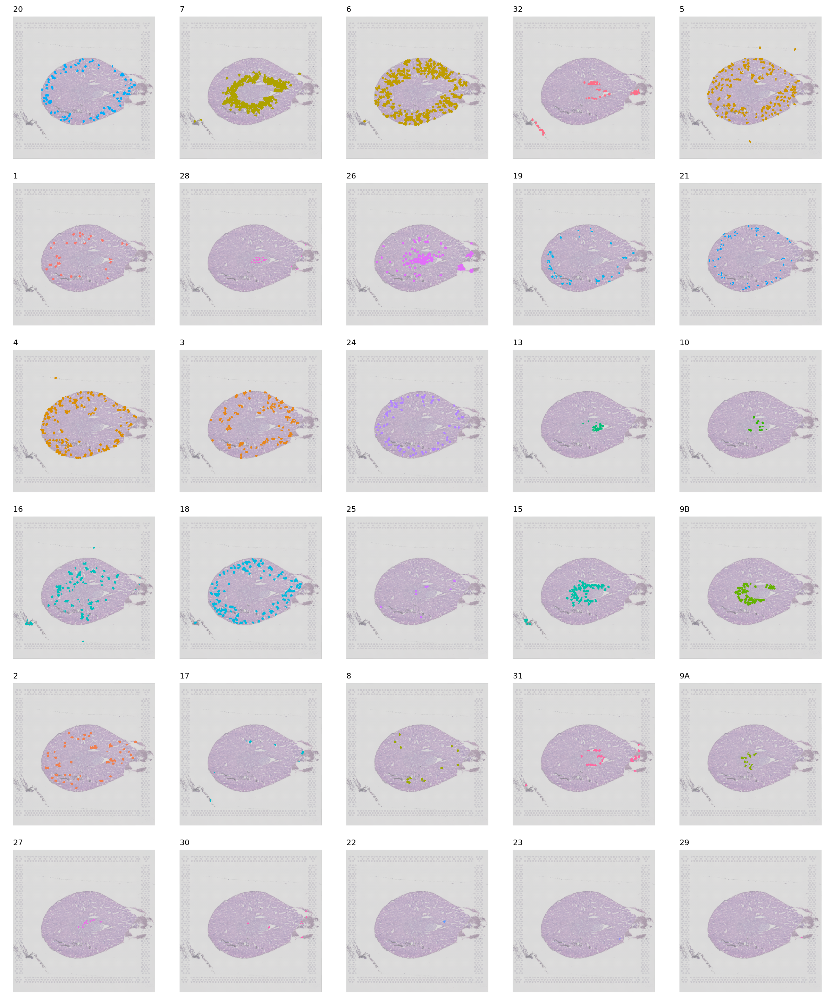

In [466]:
options(repr.plot.width = 20, repr.plot.height = 24)
ggarrange(plotlist = gps, nrow = 6, ncol = 5)

### Showing the projection performance for CytoSpace

In [24]:
cytospace <- forCytoSpace('../2.results/Mouse.kidney/data/cytospace', brain.sc, brain.st)
cytospace$Zone <- brain.sc$Zone[cytospace$OriginalCID]
cytospace$Ontology_ID <- brain.sc$Ontology_ID[cytospace$OriginalCID]

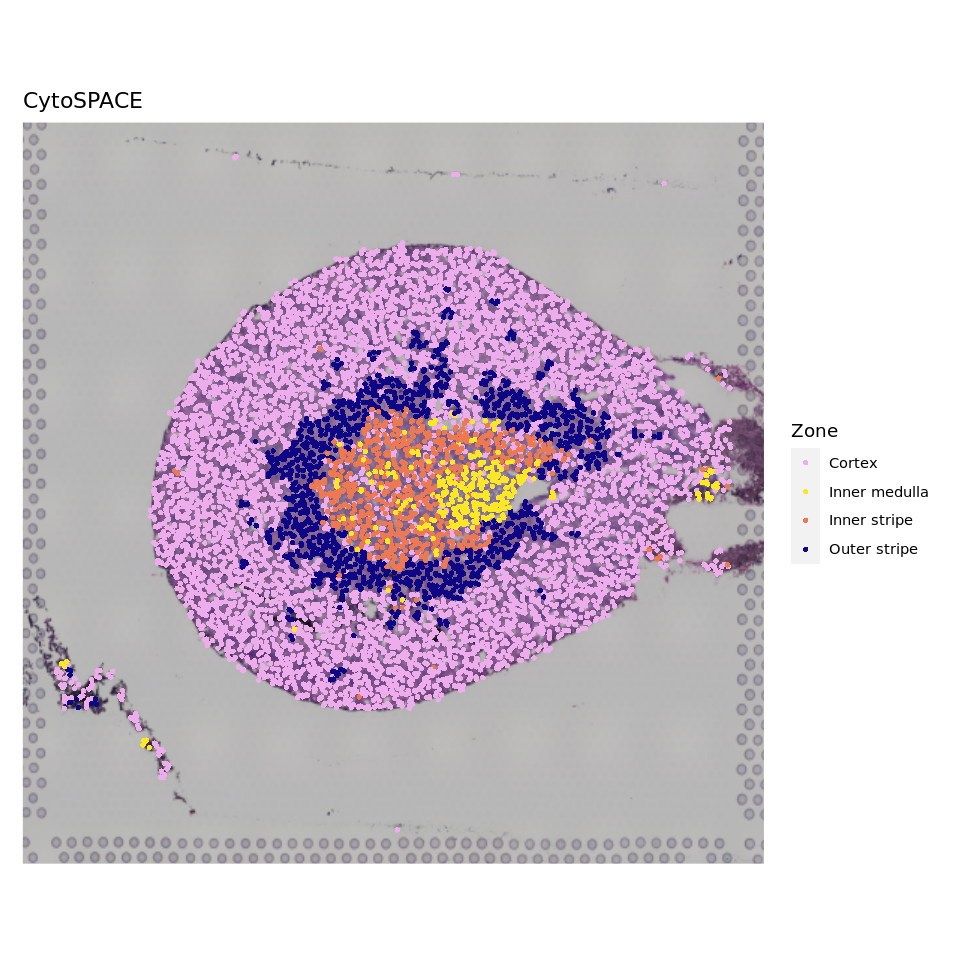

In [65]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(cytospace, group.by = 'Zone', pt.size = 0.8, image.alpha = 1, cols = zone.colors, stroke = NA) + ggtitle('CytoSPACE')
ggsave(file.path(out.figs.dir, 'cytospace.entire.UMAP.pdf'), width = 8, height = 6)

In [51]:
intersect(names(cell.colors), unique(cytospace$CellType))

[1] "19" "18" "4"  "17" "1"  "2"  "5"  "6"  "16" "8"  "9A" "9B" "26" "15" "28"
[16] "29" "11" "30" "31" "32"

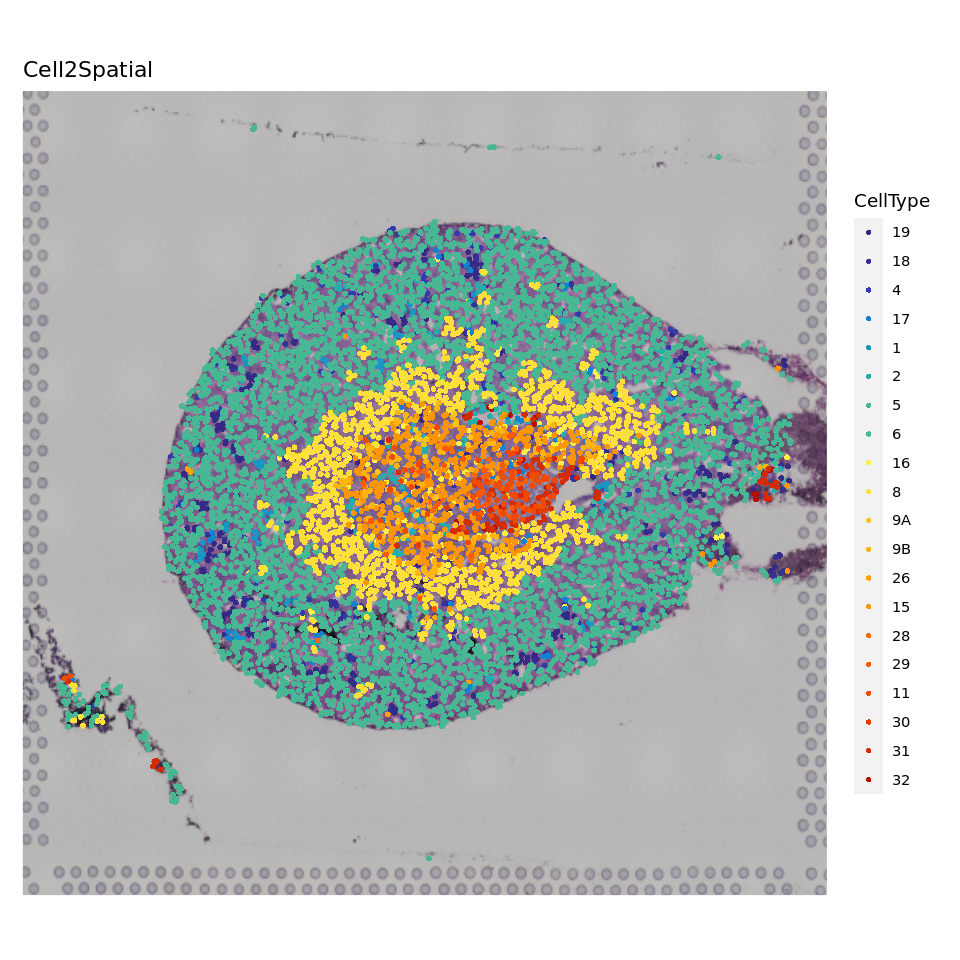

In [53]:
options(repr.plot.width = 8, repr.plot.height = 8)
cytospace$CellType <- factor(cytospace$CellType, levels = intersect(names(cell.colors), unique(cytospace$CellType)))
SpatialPlot(cytospace, group.by = 'CellType', pt.size = 0.8, image.alpha = 1, stroke = 0, cols = cell.colors) + ggtitle('Cell2Spatial')
ggsave(file.path(out.figs.dir, 'cytospace.entire.celltype.UMAP.pdf'), width = 8, height = 6)

In [72]:
f.ctypes <- cytospace$Zone %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(cytospace, Zone == ct) %>% Cells
    obj.sub <- cytospace[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 0.5, group.by = 'Zone', cols = zone.colors[ct], pt.size.factor = 1, crop = FALSE, stroke = 0) + ggtitle(ct) + NoLegend()  
})

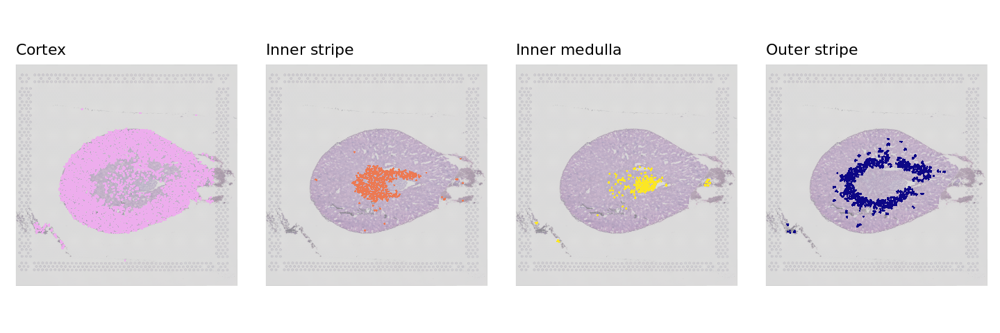

In [73]:
options(repr.plot.width = 12, repr.plot.height = 4)
ggarrange(plotlist = gps, nrow = 1, ncol = 4)
ggsave(file.path(out.figs.dir, 'cytospace.split.UMAP.pdf'), width = 12, height = 4)
ggsave(file.path(out.figs.dir, 'cytospace.split.UMAP.eps'), width = 12, height = 4)

### Showing the projection performance for tangram

In [25]:
tangram <- forTangram('../2.results/Mouse.kidney/data/Mouse.kidney_tangram.xls', brain.sc, brain.st)

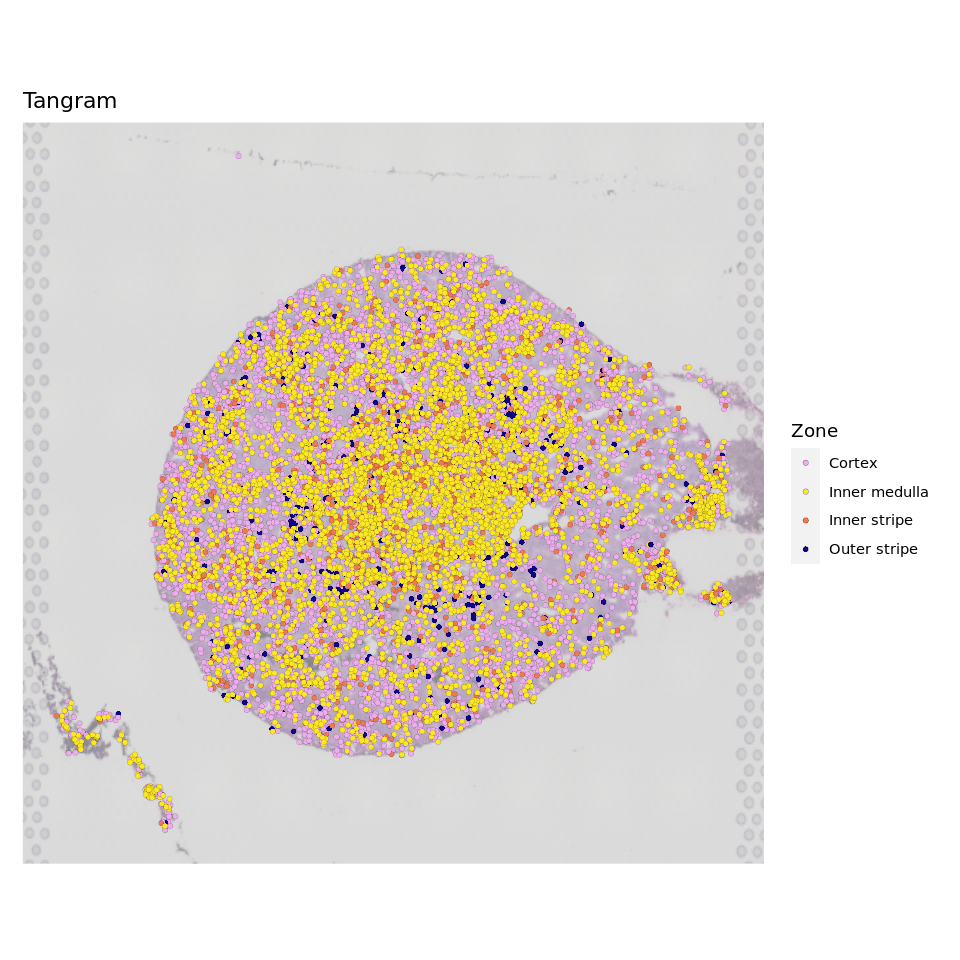

In [60]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(tangram, group.by = 'Zone', pt.size = 0.8, image.alpha = 0.5, cols = zone.colors, stroke = 0.1) + ggtitle('Tangram')
ggsave(file.path(out.figs.dir, 'tangram.entire.UMAP.pdf'), width = 8, height = 6)

In [61]:
tangram@meta.data %>% head

,orig.ident,nCount_Spatial,nFeature_Spatial,X,nCount_RNA,nFeature_RNA,nGene,nUMI,replicate,percent.mito,⋯,res.1,Lineages,Ontology_ID,mainCtype,Zone,SpotID,row,col,x.new,y.new
,<int>,<dbl>,<int>,<chr>,<dbl>,<int>,<int>,<dbl>,<int>,<dbl>,⋯,<int>,<int>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Z1_F_F1_AAACCTGAGGGCTTCC,0,2380,1633,Z1_F_F1_AAACCTGAGGGCTTCC,2379.456,1633,1633,4752,0,0.22790404,⋯,10,0,4,ProxTub,Cortex,ACTGAATGGCGAAAGT-1,241.0197,202.5433,243.2172,203.8070
Z1_F_F1_AAACGGGAGGCGACAT,0,2655,2079,Z1_F_F1_AAACGGGAGGCGACAT,2754.327,2079,2079,6079,0,0.03750617,⋯,12,0,18,DistTub,Cortex,CTGGAAATGGATGCTT-1,351.0667,307.4915,349.2411,306.5370
Z1_F_F1_AAAGATGCAGCCTATA,0,2835,2121,Z1_F_F1_AAAGATGCAGCCTATA,2555.799,2121,2122,8175,0,0.20271593,⋯,10,0,4,ProxTub,Cortex,TTACTCCGGCCGGGAA-1,320.3682,219.9108,322.3076,220.8740
Z1_F_F1_AAAGATGCAGCGAACA,0,3319,2751,Z1_F_F1_AAAGATGCAGCGAACA,3108.159,2751,2751,8799,0,0.03954995,⋯,12,0,18,DistTub,Cortex,CGAGGCTAAATATGGC-1,350.9073,244.3952,348.9643,243.1365
Z1_F_F1_AAAGATGTCTGATTCT,0,2978,2290,Z1_F_F1_AAAGATGTCTGATTCT,2799.285,2291,2291,7572,0,0.12836767,⋯,10,0,4,ProxTub,Cortex,GGCGTCCTATCCGCTG-1,339.0104,377.6518,338.4945,377.8974
Z1_F_F1_AAAGCAAAGGCGCTCT,0,2822,2066,Z1_F_F1_AAAGCAAAGGCGCTCT,2995.873,2066,2066,4527,0,0.09277667,⋯,20,1,20,UNKNOW,Cortex,TTCCAATCAGAGCTAG-1,387.3418,160.1604,385.0819,159.5384


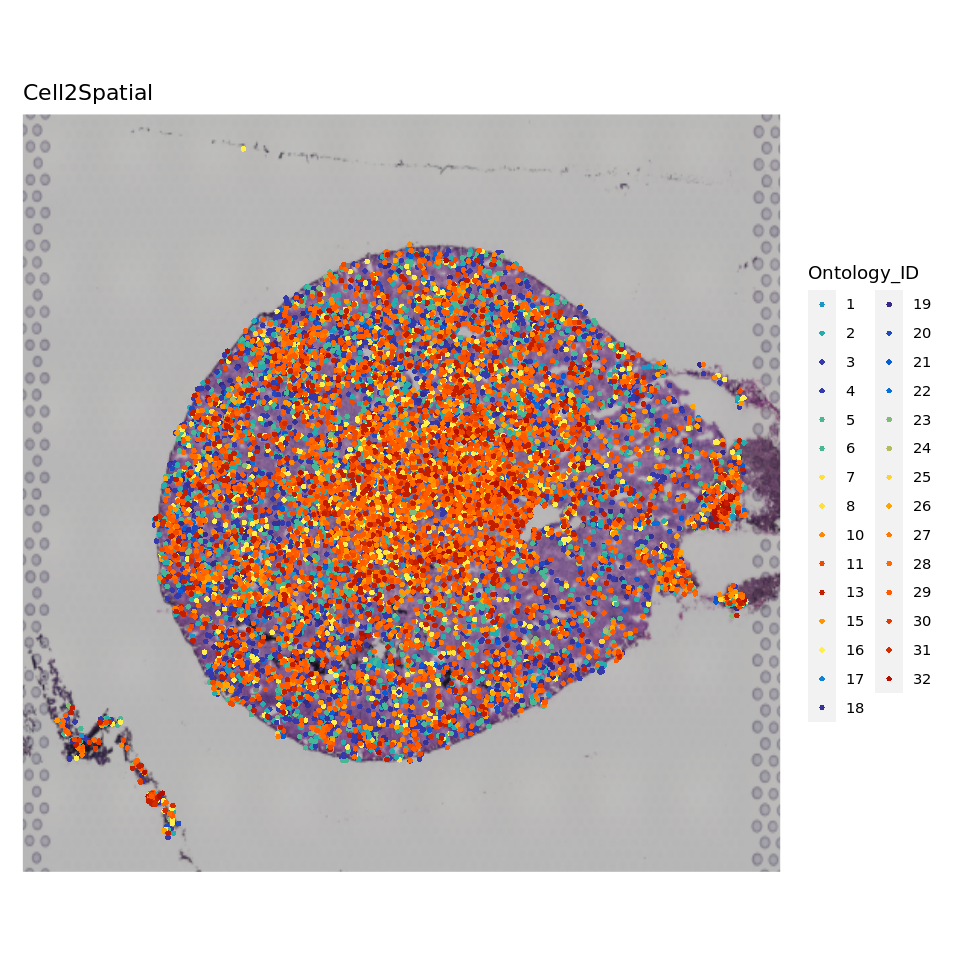

In [62]:
options(repr.plot.width = 8, repr.plot.height = 8)
tangram$CellType <- factor(tangram$Ontology_ID, levels = intersect(names(cell.colors), unique(tangram$Ontology_ID)))
SpatialPlot(tangram, group.by = 'Ontology_ID', pt.size = 0.8, image.alpha = 1, stroke = 0, cols = cell.colors) + ggtitle('Cell2Spatial')
ggsave(file.path(out.figs.dir, 'tangram.entire.celltype.UMAP.pdf'), width = 8, height = 6)

In [118]:
f.ctypes <- tangram$Zone %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(tangram, Zone == ct) %>% Cells
    obj.sub <- tangram[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 0.5, group.by = 'Zone', cols = zone.colors[ct], pt.size.factor = 1, crop = FALSE, stroke = 0) + ggtitle(ct) + NoLegend()  
})

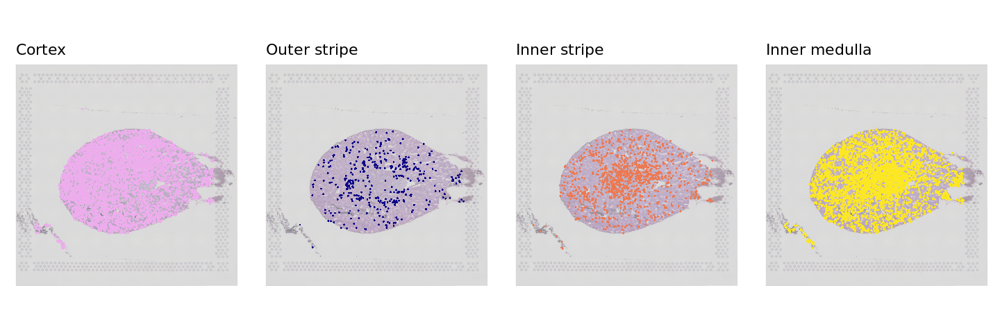

In [119]:
options(repr.plot.width = 12, repr.plot.height = 4)
ggarrange(plotlist = gps, nrow = 1, ncol = 4)
ggsave(file.path(out.figs.dir, 'tangram.split.UMAP.pdf'), width = 12, height = 4)
ggsave(file.path(out.figs.dir, 'tangram.split.UMAP.eps'), width = 12, height = 4)

### Showing the projection performance for Celltrek

In [239]:
cell.trek <- readRDS('../2.results/Mouse.kidney/data/Mouse.kidney.celltrek.RDS') %>% { forCellTrek(list(xx = .), brain.sc, brain.st) }

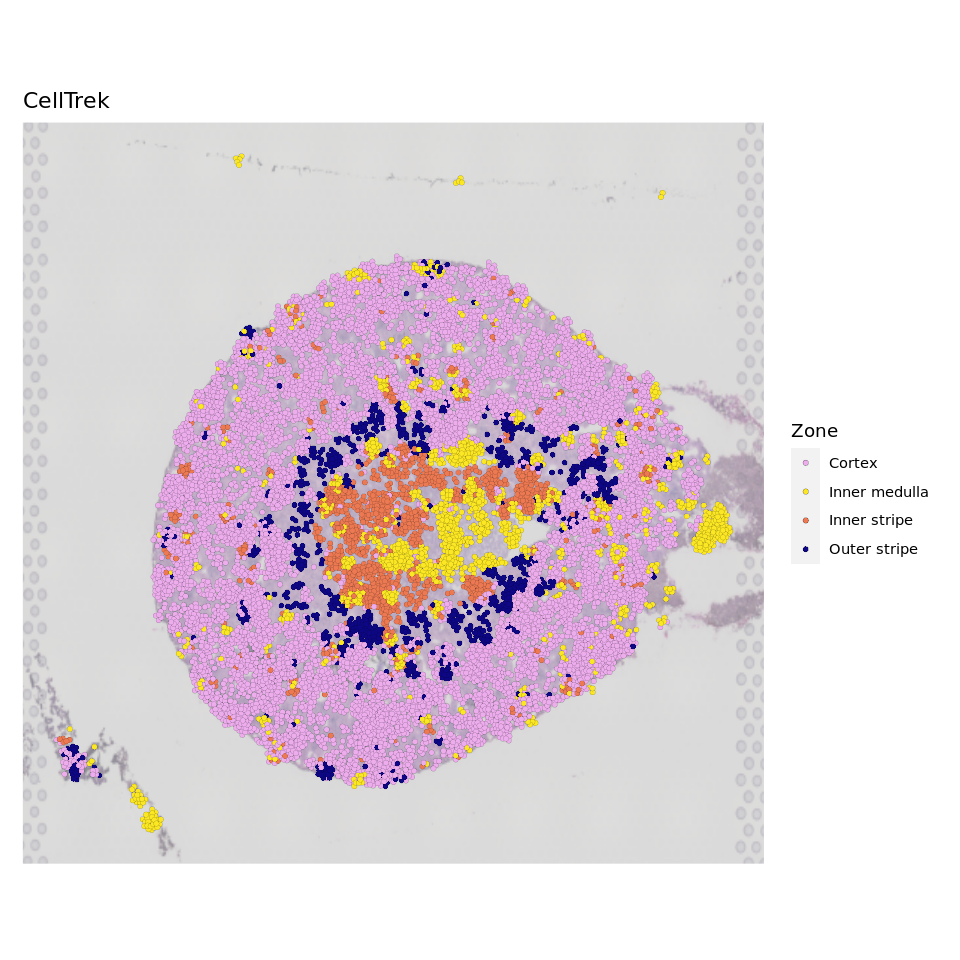

In [240]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(cell.trek, group.by = 'Zone', pt.size = 0.8, image.alpha = 0.5, cols = zone.colors, stroke = 0.1) + ggtitle('CellTrek')
ggsave(file.path(out.figs.dir, 'celltrek.entire.UMAP.pdf'), width = 8, height = 6)

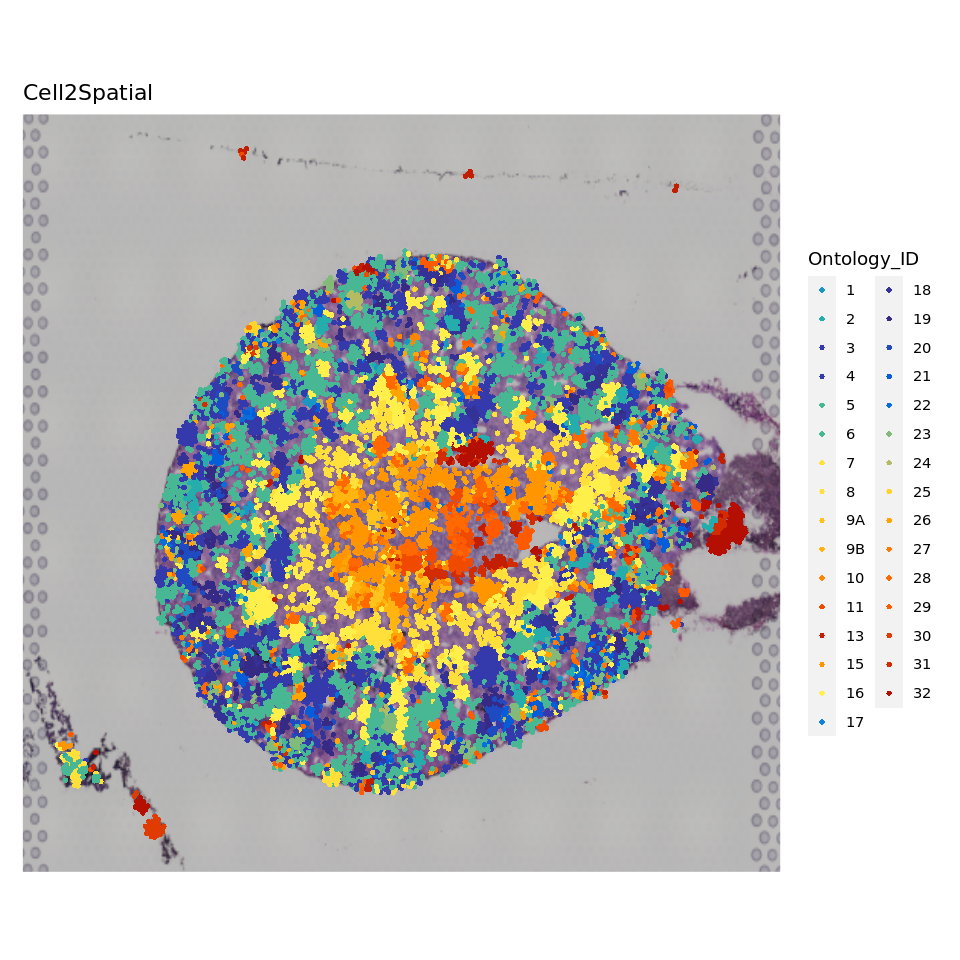

In [64]:
options(repr.plot.width = 8, repr.plot.height = 8)
cell.trek$CellType <- factor(cell.trek$Ontology_ID, levels = intersect(names(cell.colors), unique(cell.trek$Ontology_ID)))
SpatialPlot(cell.trek, group.by = 'Ontology_ID', pt.size = 0.8, image.alpha = 1, stroke = 0, cols = cell.colors) + ggtitle('Cell2Spatial')
ggsave(file.path(out.figs.dir, 'cell.trek.entire.celltype.UMAP.pdf'), width = 8, height = 6)

In [242]:
cell.trek$CellType <- factor(cell.trek$Ontology_ID, levels = intersect(names(cell.colors), unique(cell.trek$Ontology_ID)))

In [77]:
f.ctypes <- cell.trek$Zone %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(cell.trek, Zone == ct) %>% Cells
    obj.sub <- cell.trek[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 0.5, group.by = 'Zone', cols = zone.colors[ct], pt.size.factor = 1, crop = FALSE, stroke = 0) + ggtitle(ct) + NoLegend()  
})

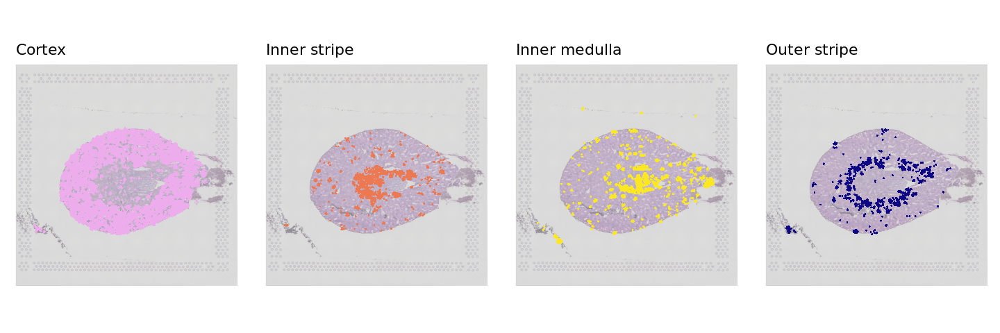

In [78]:
options(repr.plot.width = 12, repr.plot.height = 4)
ggarrange(plotlist = gps, nrow = 1, ncol = 4)
ggsave(file.path(out.figs.dir, 'celltrek.split.UMAP.pdf'), width = 12, height = 4)
ggsave(file.path(out.figs.dir, 'celltrek.split.UMAP.eps'), width = 12, height = 4)

### Showing the projection performance for Seurat

In [113]:
seurat.res <- readRDS('../2.results/Mouse.kidney/data/Mouse.kidney.seurat.RDS') 

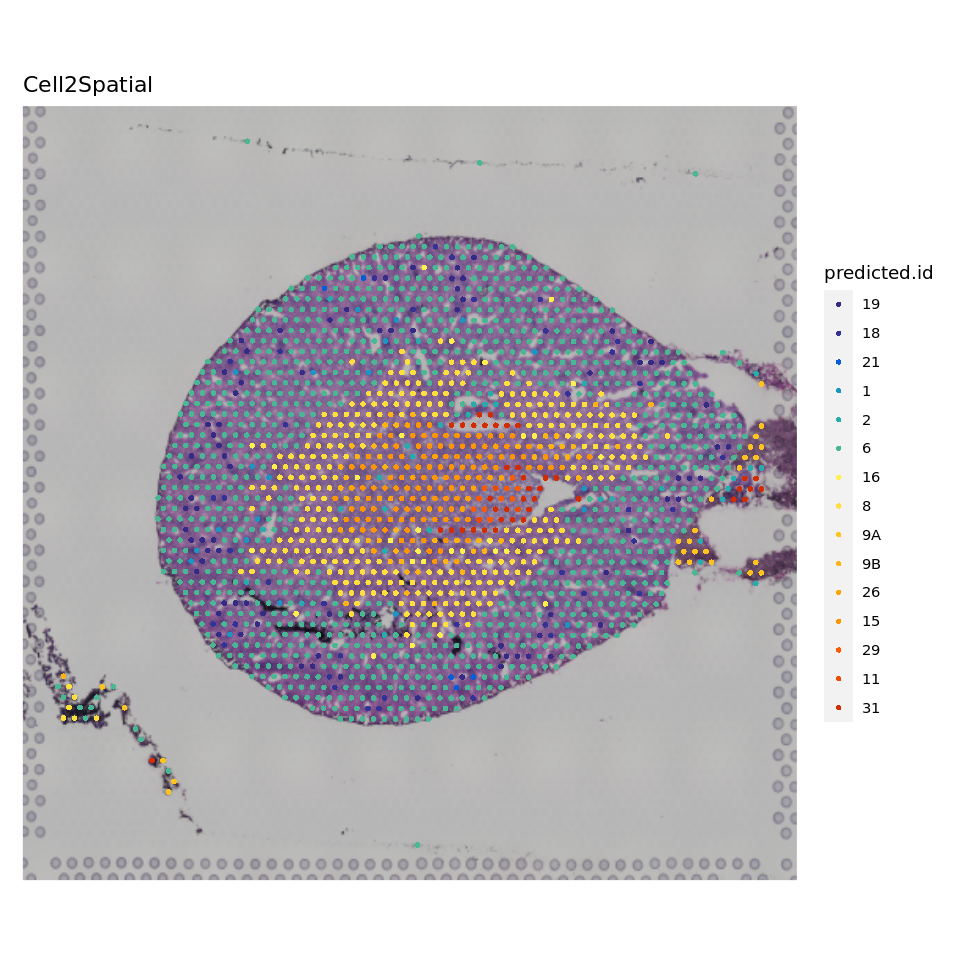

In [115]:
options(repr.plot.width = 8, repr.plot.height = 8)
seurat.res$predicted.id <- factor(seurat.res$predicted.id, levels = intersect(names(cell.colors), unique(seurat.res$predicted.id)))
SpatialPlot(seurat.res, group.by = 'predicted.id', pt.size = 0.8, image.alpha = 1, stroke = 0, cols = cell.colors) + ggtitle('Cell2Spatial')
ggsave(file.path(out.figs.dir, 'seurat.entire.celltype.UMAP.pdf'), width = 8, height = 6)

In [109]:
xx.sum <- table(brain.sc$Zone, brain.sc$Ontology_ID)
seurat.res$Zone <- '_'
seurat.res$Zone[seurat.res@meta.data$predicted.id %in% names(which(xx.sum['Cortex', ] > 0))] <- 'Cortex'
seurat.res$Zone[seurat.res@meta.data$predicted.id %in% names(which(xx.sum['Inner medulla', ] > 0))] <- 'Inner medulla'
seurat.res$Zone[seurat.res@meta.data$predicted.id %in% names(which(xx.sum['Inner stripe', ] > 0))] <- 'Inner stripe'
seurat.res$Zone[seurat.res@meta.data$predicted.id %in% names(which(xx.sum['Outer stripe', ] > 0))] <- 'Outer stripe'

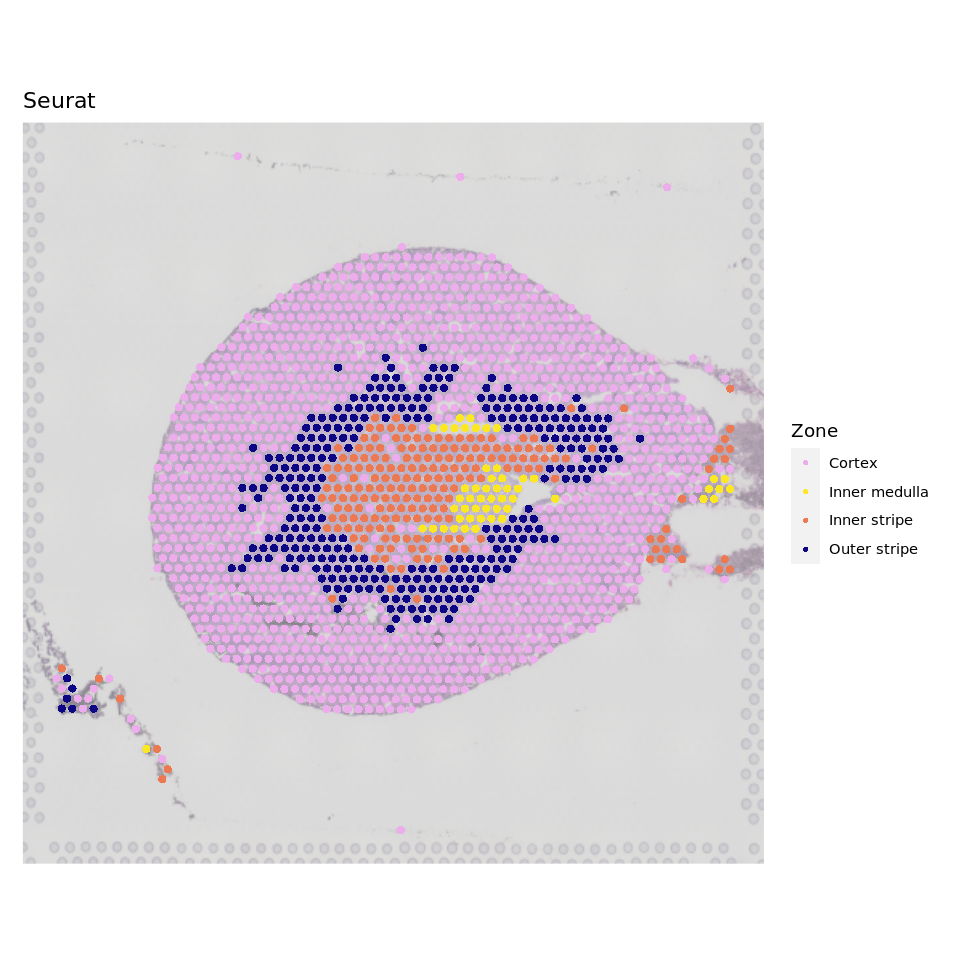

In [112]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(seurat.res, group.by = 'Zone', pt.size = 1.2, image.alpha = 0.5, cols = zone.colors, stroke = 0) + ggtitle('Seurat')
ggsave(file.path(out.figs.dir, 'seurat.entire.UMAP.pdf'), width = 8, height = 6)

In [113]:
f.ctypes <- seurat.res$Zone %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(seurat.res, Zone == ct) %>% Cells
    obj.sub <- seurat.res[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 0.5, group.by = 'Zone', cols = zone.colors[ct], pt.size.factor = 1, crop = FALSE, stroke = 0) + ggtitle(ct) + NoLegend()  
})

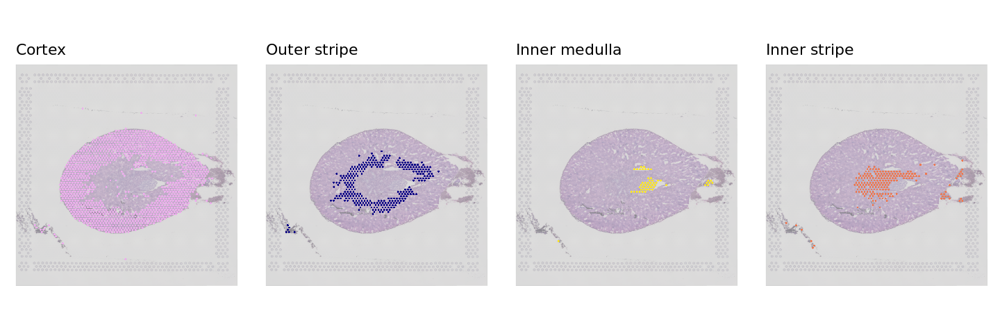

In [114]:
options(repr.plot.width = 12, repr.plot.height = 4)
ggarrange(plotlist = gps, nrow = 1, ncol = 4)
ggsave(file.path(out.figs.dir, 'seurat.split.UMAP.pdf'), width = 12, height = 4)
ggsave(file.path(out.figs.dir, 'seurat.split.UMAP.eps'), width = 12, height = 4)

### Comparison of the performace based on cellular compositions, take CARD deconvolution results as standard

In [71]:
card.res <- readRDS('../2.results/Mouse.kidney/data/Mouse.kidney.card.RDS')$decon

In [86]:
prop.card <- card.res@Proportion_CARD * 10
prop.card <- apply(prop.card, 1, ceiling) %>% t

In [87]:
prop <- rep(0, length(levels(brain.sc$Ontology_ID))) %>% `names<-`(levels(brain.sc$Ontology_ID))
prop.card <- colSums(prop.card) / sum(prop.card) * 100
prop.card <- prop.card[names(prop)]
prop.card

1         2         3         4         5         6         7         8 
 2.584434  2.601335  2.598518  2.595702  2.584434 12.272894  8.757500  4.226642 
       9A        9B        10        11      <NA>        13      <NA>        15 
 2.584434  2.584434  2.584434  2.584434        NA  2.584434        NA  2.829498 
       16        17        18        19        20        21        22        23 
 4.046365  2.584434  2.584434  2.911186  2.587251  2.830906  2.584434  2.584434 
       24        25        26        27        28        29        30        31 
 2.584434  2.584434  2.595702  2.584434  2.584434  2.595702  2.585843  2.605560 
       32 
 2.592885

In [88]:
prop <- rep(0, length(levels(brain.sc$Ontology_ID))) %>% `names<-`(levels(brain.sc$Ontology_ID))
prop.cell2spatial <- cell2spatial$Ontology_ID %>% table %>% {./sum(.)} * 100
prop[names(prop.cell2spatial)] <- prop.cell2spatial
prop.cell2spatial <- prop

prop <- rep(0, length(levels(brain.sc$Ontology_ID))) %>% `names<-`(levels(brain.sc$Ontology_ID))
prop.cytospace <- cytospace$Ontology_ID %>% table %>% {./sum(.)} * 100
prop[names(prop.cytospace)] <- prop.cytospace
prop.cytospace <- prop

prop <- rep(0, length(levels(brain.sc$Ontology_ID))) %>% `names<-`(levels(brain.sc$Ontology_ID))
prop.cell.trek <- cell.trek$Ontology_ID %>% table %>% {./sum(.)} * 100
prop[names(prop.cell.trek)] <- prop.cell.trek
prop.cell.trek <- prop

prop <- rep(0, length(levels(brain.sc$Ontology_ID))) %>% `names<-`(levels(brain.sc$Ontology_ID))
prop.tangram <- tangram$Ontology_ID %>% table %>% {./sum(.)} * 100
prop[intersect(names(prop.tangram), names(prop))] <- prop.tangram[intersect(names(prop.tangram), names(prop))]
prop.tangram <- prop

prop <- rep(0, length(levels(brain.sc$Ontology_ID))) %>% `names<-`(levels(brain.sc$Ontology_ID))
prop.seurat <- seurat.res$predicted.id %>% table %>% {./sum(.)} * 100
prop[names(prop.seurat)] <- prop.seurat
prop.seurat <- prop

In [89]:
prop.df <- cbind.data.frame(CARD = prop.card, Cell2Spatial = prop.cell2spatial, CytoSPACE = prop.cytospace, CellTrek = prop.cell.trek, Tangram = prop.tangram, Seurat = prop.seurat)

In [119]:
openxlsx::write.xlsx(prop.df, file = file.path(out.data.dir, 'methods.corr.vs.card.xlsx'), rowNames = TRUE)

In [91]:
prop.df$CellType <- rownames(prop.df)
gps <- lapply(colnames(prop.df)[2 : (ncol(prop.df) - 1)], function(meth) {
    plot.df.sub <- prop.df[, c('CARD', meth, 'CellType')] %>% `colnames<-`(c('CARD', 'Y', 'CellType'))
    ggplot(plot.df.sub, aes(x = CARD, y = Y)) + geom_point(size = 4, aes(color = CellType)) + theme_classic() + 
        geom_smooth(method = lm, se = TRUE) + ylab(meth) + ggpubr::stat_cor(method = "pearson")
})

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


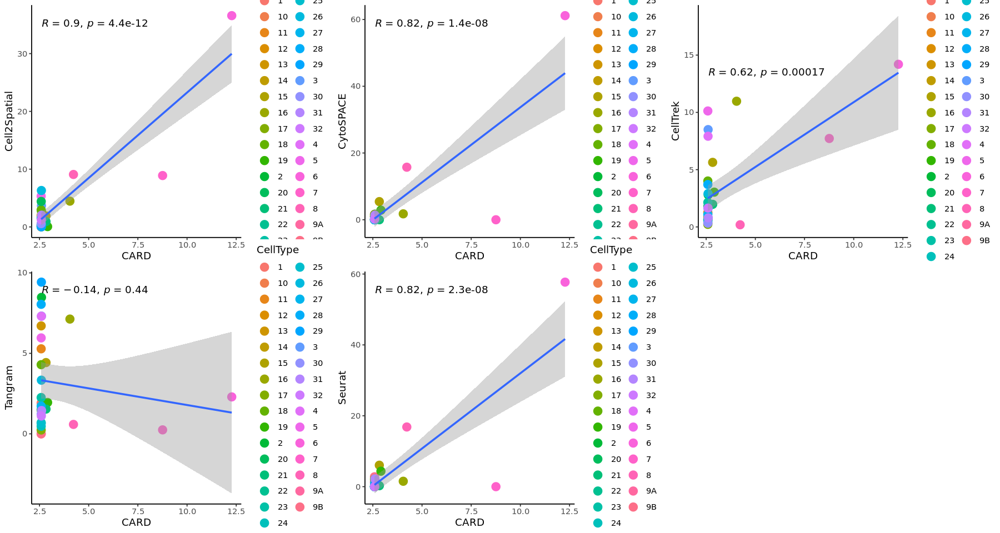

In [92]:
options(repr.plot.width = 15, repr.plot.height = 8)
ggarrange(plotlist = gps, nrow = 2, ncol = 3)
ggsave(file.path(out.figs.dir, 'methods.corr.vs.card.pdf'), width = 15, height = 8)

#### J-index calculation

In [29]:
Idents(brain.sc) <- brain.sc$Ontology_ID

In [30]:
markers.sc <- FindAllMarkers(brain.sc, only.pos = TRUE, logfc.threshold = 0.25, min.pct = 0.25, assay = 'SCT')

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9A

Calculating cluster 9B

Calculating cluster 10

Calculating cluster 11

Calculating cluster 13

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20

Calculating cluster 21

Calculating cluster 22

Calculating cluster 23

Calculating cluster 24

Calculating cluster 25

Calculating cluster 26

Calculating cluster 27

Calculating cluster 28

Calculating cluster 29

Calculating cluster 30

Calculating cluster 31

Calculating cluster 32



In [31]:
top20.markers.sc <- markers.sc %>% group_by(cluster) %>% top_n(n = 30, wt = avg_log2FC)

In [32]:
#brain.st <- AddModuleScore(brain.st, features = split(top20.markers.sc$gene, top20.markers.sc$cluster))
marker.lust <- split(top20.markers.sc$gene, top20.markers.sc$cluster)

In [34]:
card.res <- readRDS('../2.results/Mouse.kidney/data/Mouse.kidney.card.RDS')$decon@Proportion_CARD[, names(marker.lust)]

In [35]:
colnames(card.res) <- paste0('Cluster', 1 : ncol(card.res))
brain.st@meta.data <- cbind.data.frame(brain.st@meta.data, card.res)

In [95]:
avgDist <- function(obj, brain.st, ctype, p.cut = 0.05) {
    res <- lapply(1 : length(names(marker.lust)), function(idx) {
        cell.name <- names(marker.lust)[idx]
        scores <- brain.st@meta.data[, paste0('Cluster', idx)] %>% `names<-`(rownames(brain.st@meta.data))
        pvals <- pnorm(scores, mean = mean(scores), sd = sd(scores), lower.tail = FALSE)
        spots <- pvals[pvals < p.cut] %>% names
        if (length(spots) == 0) return(0)
        if (!(cell.name %in% unique(obj@meta.data[, ctype]))) return(0)
        if (sum(spots %in% obj$SpotName) == 0) return(0)
        #xx <- subset(obj, SpotName %in% spots)
        xx <- obj
        if (!(cell.name %in% unique(xx@meta.data[, ctype]))) return(0)
        xx <- table(xx$SpotName, xx@meta.data[, ctype])
        #pre <- colSums(xx > 0)[cell.name]
        pre <- rownames(xx)[which(xx[, cell.name] > 0)]
        length(intersect(spots, pre)) / length(union(spots, pre)) * 100
    }) %>% unlist(.) %>% as.vector #%>% mean
    mean(res) * sum(res > 0) / length(res)
}

In [1]:
p.cut <- 0.01

In [98]:
xx.1 <- avgDist(cell2spatial, brain.st, 'CellType', p.cut = p.cut)
print(xx.1)

[1] 10.52752


In [99]:
cytospace$SpotName <- cytospace$SpotID 
xx.2 <- avgDist(cytospace, brain.st, 'CellType', p.cut = p.cut)
print(xx.2)

[1] 8.990907


In [100]:
cell.trek$SpotName <- cell.trek$Spot 
xx.3 <- avgDist(cell.trek, brain.st, 'Ontology_ID', p.cut = p.cut)
print(xx.3)

[1] 8.632839


In [101]:
tangram$SpotName <- tangram$SpotID
#tangram$SpotName <- gsub('-151673', '\\.151673', tangram$SpotName)
xx.4 <- avgDist(tangram, brain.st, 'Ontology_ID', p.cut = p.cut)
print(xx.4)

[1] 8.116474


In [102]:
seurat.res$SpotName <- rownames(seurat.res@meta.data)
xx.5 <- avgDist(seurat.res, brain.st, 'predicted.id', p.cut = p.cut)
print(xx.5)

[1] 3.734053


In [103]:
plot.df <- cbind.data.frame(Index = c(xx.1, xx.2, xx.3, xx.4, xx.5), Method = c('Cell2Spatial', 'CytoSPACE', 'CellTrek', 'Tangram', 'Seurat'), Data = 'DLPFC')

In [104]:
openxlsx::write.xlsx(plot.df, file = file.path(out.data.dir, 'Mouse.1.acc.xlsx'))

### Calculate the K-distance for each cell type

In [168]:
anno <- openxlsx::read.xlsx('../0.data/Mouse.kidney/mouse.kind.xlsx')[, c(1, 2, 3, 4, 6)]
rownames(anno) <- anno[, 1]
head(anno)

,Cell.type/state.numbera,Epithelial.cell.statea,Epithelial.type,Zone,Ground.truth.ordering.from.state.19.to.state.32b
,<chr>,<chr>,<chr>,<chr>,<dbl>
19,19,Nephron connecting tubule,Nephron,Cortex,1
18,18,Distal convoluted tubule,Nephron,Cortex,2
3,3,Segment 1 of proximal tubule,Nephron,Cortex,2
4,4,Segment 1 of proximal tubule,Nephron,Cortex,2
17,17,Macula densa,Nephron,Cortex,3
1,1,Podocytes (visceral epithelium),Nephron,Cortex,4


##### Cell2Spatial

In [271]:
ref.obj <- subset(brain.st, idents = '11')
ref.coord <- GetTissueCoordinates(ref.obj)[colnames(ref.obj), ]

In [272]:
obj.cells <- intersect(levels(brain.sc$Ontology_ID), unique(cell2spatial$Ontology_ID))
dist.res <- lapply(obj.cells, function(ct) {    
    qry.obj <- subset(cell2spatial, Ontology_ID == ct)
    qry.coord <- GetTissueCoordinates(qry.obj)[colnames(qry.obj), ]
    dis.vec <- apply(qry.coord, 1, function(xx) {
        dis.res <- apply(ref.coord, 1, function(yy) {
            distances <- sqrt((xx[1] - yy[1])^2 + (xx[2] - yy[2])^2)         
        }) %>% sort 
        mean(dis.res)
    }) %>% sort %>% median
    res.df <- cbind.data.frame(Dist = dis.vec, CellType = ct)
}) %>% do.call(rbind, .)

In [273]:
diff.cells <- setdiff(names(cell.colors), unique(cell2spatial$Ontology_ID))
length(diff.cells)
if (length(diff.cells) > 0) {
    diff.df <- lapply(diff.cells, function(xt) return(c(mean(dist.res[, 1]), xt))) %>% do.call(rbind, .) %>% as.data.frame %>% `colnames<-`(colnames(dist.res))
    dist.res <- rbind.data.frame(dist.res, diff.df)
}

[1] 0

In [274]:
rownames(dist.res) <- dist.res[, 2]
dist.res <- cbind.data.frame(dist.res[names(cell.colors), ], Trueth = anno[names(cell.colors), 5], Epithelial.type = anno[names(cell.colors), 3])
#dist.res <- cbind.data.frame(dist.res[ovp.cells, ], Trueth = anno[ovp.cells, 5])
dist.res$Ours <- rank(-dist.res[, 1])
head(dist.res)
dist.res.cell2spatial <- dist.res
dist.res.cell2spatial$Method <- 'Cell2Spatial'

,Dist,CellType,Trueth,Epithelial.type,Ours
,<dbl>,<chr>,<dbl>,<chr>,<dbl>
19,144.0173,19,1,Nephron,7
18,138.2882,18,2,Nephron,10
3,131.4710,3,2,Nephron,14
4,133.6901,4,2,Nephron,12
20,138.0064,20,2,Ureteric,11
21,157.6031,21,3,Ureteric,2


In [275]:
xx.c <- subset(dist.res.cell2spatial, Epithelial.type == 'Nephron')
xx.c[, 'Ours'] <- rank(xx.c[, 'Ours'])

xx.v <- subset(dist.res.cell2spatial, Epithelial.type == 'Ureteric')
xx.v[, 'Ours'] <- rank(xx.v[, 'Ours'])

dist.res <- rbind.data.frame(xx.c, xx.v)

In [1]:
options(repr.plot.width = 7, repr.plot.height = 4)

#order <- aggregate(Dist ~ CellType, dist.res, 'median') %>% { .[order(.[, 2]), ]}
dist.res$CellType <- factor(dist.res$CellType, levels = obj.cells)
gp <- ggplot(dist.res, aes(x = Ours, y = Trueth)) + geom_point(aes(color = CellType), size = 3) + geom_smooth(method = lm) + theme_bw(base_size = 12) + theme(panel.grid = element_blank(), axis.text.x = element_text(angle = 45, hjust = 1)) + xlab('Cell2Spatial') + ylab('Truth') + stat_cor(method = "spearman") + scale_colour_manual(values = cell.colors)

openxlsx::write.xlsx(dist.res, file = file.path(out.data.dir, 'cell2spatial.distance.xlsx'))
ggsave(file.path(out.figs.dir, 'cell2spatial.distance.pdf'), width = 6, height = 4)

##### CytoSPACE

In [266]:
obj.cells <- intersect(levels(brain.sc$Ontology_ID), unique(cytospace$CellType))
dist.res <- lapply(obj.cells, function(ct) {
    qry.obj <- subset(cytospace, CellType == ct)
    qry.coord <- GetTissueCoordinates(qry.obj)[colnames(qry.obj), ]
    dis.vec <- apply(qry.coord, 1, function(xx) {
        dis.res <- apply(ref.coord, 1, function(yy) {
            distances <- sqrt((xx[1] - yy[1])^2 + (xx[2] - yy[2])^2)         
        }) %>% sort 
        mean(dis.res)
    }) %>% median(.)
    res.df <- cbind.data.frame(Dist = dis.vec, CellType = ct)
}) %>% do.call(rbind, .)

In [267]:
diff.cells <- setdiff(names(cell.colors), unique(cytospace$CellType))
length(diff.cells)
if (length(diff.cells) > 0) {
    diff.df <- lapply(diff.cells, function(xt) return(c(mean(dist.res[, 1]), xt))) %>% do.call(rbind, .) %>% as.data.frame %>% `colnames<-`(colnames(dist.res))
    dist.res <- rbind.data.frame(dist.res, diff.df)
    dist.res[, 1] <- as.numeric(dist.res[, 1])                      
}

[1] 11

In [268]:
rownames(dist.res) <- dist.res[, 2]
#dist.res <- cbind.data.frame(dist.res[names(cell.colors), ], Trueth = anno[names(cell.colors), 5])
dist.res <- cbind.data.frame(dist.res[names(cell.colors), ], Trueth = anno[names(cell.colors), 5], Epithelial.type = anno[names(cell.colors), 3])
dist.res$Ours <- rank(-dist.res[, 1])
head(dist.res)

dist.res.cytospace <- dist.res
dist.res.cytospace$Method <- 'CytoSPACE'

,Dist,CellType,Trueth,Epithelial.type,Ours
,<dbl>,<chr>,<dbl>,<chr>,<dbl>
19,140.0003,19,1,Nephron,3
18,130.5367,18,2,Nephron,6
3,80.4771,3,2,Nephron,15
4,136.8485,4,2,Nephron,4
20,80.4771,20,2,Ureteric,15
21,80.4771,21,3,Ureteric,15


In [269]:
xx.c <- subset(dist.res.cytospace, Epithelial.type == 'Nephron')
xx.c[, 'Ours'] <- rank(xx.c[, 'Ours'])

xx.v <- subset(dist.res.cytospace, Epithelial.type == 'Ureteric')
xx.v[, 'Ours'] <- rank(xx.v[, 'Ours'])

dist.res <- rbind.data.frame(xx.c, xx.v)

In [3]:
options(repr.plot.width = 7, repr.plot.height = 4)

order <- aggregate(Dist ~ CellType, dist.res, 'median') %>% { .[order(.[, 2]), ]}
dist.res$CellType <- factor(dist.res$CellType, levels = names(cell.colors))
gp <- ggplot(dist.res, aes(x = Ours, y = Trueth)) + geom_point(aes(color= CellType), size = 3) + geom_smooth(method = lm) + theme_bw(base_size = 12) + theme(panel.grid = element_blank(), axis.text.x = element_text(angle = 45, hjust = 1)) + xlab('Cell2Spatial') + ylab('Truth') + stat_cor(method = "spearman") + scale_colour_manual(values = cell.colors)

openxlsx::write.xlsx(dist.res, file = file.path(out.data.dir, 'cytospace.distance.xlsx'))
ggsave(file.path(out.figs.dir, 'cytospace.distance.pdf'), width = 6, height = 4)

##### CellTrek

In [278]:
obj.cells <- intersect(levels(brain.sc$Ontology_ID), unique(cell.trek$CellType))
dist.res <- lapply(obj.cells, function(ct) {
    qry.obj <- subset(cell.trek, CellType == ct)
    qry.coord <- GetTissueCoordinates(qry.obj)[colnames(qry.obj), ]
    dis.vec <- apply(qry.coord, 1, function(xx) {
        dis.res <- apply(ref.coord, 1, function(yy) {
            distances <- sqrt((xx[1] - yy[1])^2 + (xx[2] - yy[2])^2)         
        }) %>% sort 
        mean(dis.res)
    }) %>% median(.)
    res.df <- cbind.data.frame(Dist = dis.vec, CellType = ct)
}) %>% do.call(rbind, .)

In [279]:
diff.cells <- setdiff(names(cell.colors), unique(cell.trek$CellType))
length(diff.cells)
if (length(diff.cells) > 0) {
    diff.df <- lapply(diff.cells, function(xt) return(c(mean(dist.res[, 1]), xt))) %>% do.call(rbind, .) %>% as.data.frame %>% `colnames<-`(colnames(dist.res))
    dist.res <- rbind.data.frame(dist.res, diff.df)
    dist.res[, 1] <- as.numeric(dist.res[, 1])  
}

[1] 0

In [280]:
rownames(dist.res) <- dist.res[, 2]
#dist.res <- cbind.data.frame(dist.res[names(cell.colors), ], Trueth = anno[names(cell.colors), 5])
dist.res <- cbind.data.frame(dist.res[names(cell.colors), ], Trueth = anno[names(cell.colors), 5], Epithelial.type = anno[names(cell.colors), 3])

dist.res$Ours <- rank(-dist.res[, 1])
head(dist.res)

dist.res.celltrek <- dist.res
dist.res.celltrek$Method <- 'CellTrek'

,Dist,CellType,Trueth,Epithelial.type,Ours
,<dbl>,<chr>,<dbl>,<chr>,<dbl>
19,148.9657,19,1,Nephron,4
18,120.4131,18,2,Nephron,15
3,127.6890,3,2,Nephron,12
4,137.1074,4,2,Nephron,6
20,159.5889,20,2,Ureteric,2
21,123.1271,21,3,Ureteric,14


In [281]:
xx.c <- subset(dist.res.celltrek, Epithelial.type == 'Nephron')
xx.c[, 'Ours'] <- rank(xx.c[, 'Ours'])

xx.v <- subset(dist.res.celltrek, Epithelial.type == 'Ureteric')
xx.v[, 'Ours'] <- rank(xx.v[, 'Ours'])

dist.res <- rbind.data.frame(xx.c, xx.v)

In [6]:
options(repr.plot.width = 7, repr.plot.height = 4)

order <- aggregate(Dist ~ CellType, dist.res, 'median') %>% { .[order(.[, 2]), ]}
dist.res$CellType <- factor(dist.res$CellType, levels = names(cell.colors))
gp <- ggplot(dist.res, aes(x = Ours, y = Trueth)) + geom_point(aes(color = CellType), size = 3) + geom_smooth(method = lm) + theme_bw(base_size = 12) + theme(panel.grid = element_blank(), axis.text.x = element_text(angle = 45, hjust = 1)) + xlab('Cell2Spatial') + ylab('Truth') + stat_cor(method = "spearman") + scale_colour_manual(values = cell.colors)

openxlsx::write.xlsx(dist.res, file = file.path(out.data.dir, 'celltrek.distance.xlsx'))
ggsave(file.path(out.figs.dir, 'celltrek.distance.pdf'), width = 6, height = 4)

##### Tangram

In [283]:
obj.cells <- intersect(levels(brain.sc$Ontology_ID), unique(tangram$Ontology_ID))
dist.res <- lapply(obj.cells, function(ct) {
    qry.obj <- subset(tangram, Ontology_ID == ct)
    qry.coord <- GetTissueCoordinates(qry.obj)[colnames(qry.obj), ]
    dis.vec <- apply(qry.coord, 1, function(xx) {
        dis.res <- apply(ref.coord, 1, function(yy) {
            distances <- sqrt((xx[1] - yy[1])^2 + (xx[2] - yy[2])^2)         
        }) %>% sort 
        mean(dis.res)
    }) %>% median(.)
    res.df <- cbind.data.frame(Dist = dis.vec, CellType = ct)
}) %>% do.call(rbind, .)

In [284]:
diff.cells <- setdiff(names(cell.colors), unique(tangram$Ontology_ID))
length(diff.cells)
if (length(diff.cells) > 0) {
    diff.df <- lapply(diff.cells, function(xt) return(c(max(dist.res[, 1]), xt))) %>% do.call(rbind, .) %>% as.data.frame %>% `colnames<-`(colnames(dist.res))
    dist.res <- rbind.data.frame(dist.res, diff.df)
    dist.res[, 1] <- as.numeric(dist.res[, 1]) 
}

[1] 0

In [285]:
rownames(dist.res) <- dist.res[, 2]
#dist.res <- cbind.data.frame(dist.res[names(cell.colors), ], Trueth = anno[names(cell.colors), 5])
dist.res <- cbind.data.frame(dist.res[names(cell.colors), ], Trueth = anno[names(cell.colors), 5], Epithelial.type = anno[names(cell.colors), 3])

dist.res$Ours <- rank(-dist.res[, 1])
head(dist.res)
dist.res.tangram <- dist.res
dist.res.tangram$Method <- 'Tangram'

,Dist,CellType,Trueth,Epithelial.type,Ours
,<dbl>,<chr>,<dbl>,<chr>,<dbl>
19,131.2271,19,1,Nephron,3
18,119.8528,18,2,Nephron,11
3,122.3219,3,2,Nephron,7
4,128.0580,4,2,Nephron,4
20,141.1720,20,2,Ureteric,2
21,121.0191,21,3,Ureteric,9


In [286]:
xx.c <- subset(dist.res.tangram, Epithelial.type == 'Nephron')
xx.c[, 'Ours'] <- rank(xx.c[, 'Ours'])

xx.v <- subset(dist.res.tangram, Epithelial.type == 'Ureteric')
xx.v[, 'Ours'] <- rank(xx.v[, 'Ours'])

dist.res <- rbind.data.frame(xx.c, xx.v)

In [5]:
options(repr.plot.width = 7, repr.plot.height = 4)

order <- aggregate(Dist ~ CellType, dist.res, 'median') %>% { .[order(.[, 2]), ]}
dist.res$CellType <- factor(dist.res$CellType, levels = obj.cells)
gp <- ggplot(dist.res, aes(x = Ours, y = Trueth)) + geom_point(aes(color = CellType), size = 3) + geom_smooth(method = lm) + theme_bw(base_size = 12) + theme(panel.grid = element_blank(), axis.text.x = element_text(angle = 45, hjust = 1)) + xlab('Cell2Spatial') + ylab('Truth') + stat_cor(method = "spearman") + scale_colour_manual(values = cell.colors)

openxlsx::write.xlsx(dist.res, file = file.path(out.data.dir, 'tangram.distance.xlsx'))
ggsave(file.path(out.figs.dir, 'tangram.distance.pdf'), width = 6, height = 4)

##### Seurat 

In [288]:
obj.cells <- intersect(levels(brain.sc$Ontology_ID), unique(seurat.res$predicted.id))
dist.res <- lapply(obj.cells, function(ct) {
    qry.obj <- subset(seurat.res, predicted.id == ct)
    qry.coord <- GetTissueCoordinates(qry.obj)[colnames(qry.obj), ]
    dis.vec <- apply(qry.coord, 1, function(xx) {
        dis.res <- apply(ref.coord, 1, function(yy) {
            distances <- sqrt((xx[1] - yy[1])^2 + (xx[2] - yy[2])^2)         
        }) %>% sort 
        mean(dis.res)
    }) %>% median(.)
    res.df <- cbind.data.frame(Dist = dis.vec, CellType = ct)
}) %>% do.call(rbind, .)

In [289]:
diff.cells <- setdiff(names(cell.colors), unique(seurat.res$predicted.id))
length(diff.cells)
if (length(diff.cells) > 0) {
    diff.df <- lapply(diff.cells, function(xt) return(c(mean(dist.res[, 1]), xt))) %>% do.call(rbind, .) %>% as.data.frame %>% `colnames<-`(colnames(dist.res))
    dist.res <- rbind.data.frame(dist.res, diff.df)
    dist.res[, 1] <- as.numeric(dist.res[, 1]) 
}

[1] 16

In [290]:
rownames(dist.res) <- dist.res[, 2]
#dist.res <- cbind.data.frame(dist.res[names(cell.colors), ], Trueth = anno[names(cell.colors), 5])
dist.res <- cbind.data.frame(dist.res[names(cell.colors), ], Trueth = anno[names(cell.colors), 5], Epithelial.type = anno[names(cell.colors), 3])

dist.res$Ours <- rank(-dist.res[, 1])
head(dist.res)
dist.res.seurat <- dist.res
dist.res.seurat$Method <- 'Seurat'

,Dist,CellType,Trueth,Epithelial.type,Ours
,<dbl>,<chr>,<dbl>,<chr>,<dbl>
19,148.68667,19,1,Nephron,2.0
18,138.36898,18,2,Nephron,4.0
3,90.48385,3,2,Nephron,15.5
4,90.48385,4,2,Nephron,15.5
20,90.48385,20,2,Ureteric,15.5
21,113.63758,21,3,Ureteric,6.0


In [291]:
xx.c <- subset(dist.res.seurat, Epithelial.type == 'Nephron')
xx.c[, 'Ours'] <- rank(xx.c[, 'Ours'])

xx.v <- subset(dist.res.seurat, Epithelial.type == 'Ureteric')
xx.v[, 'Ours'] <- rank(xx.v[, 'Ours'])

dist.res <- rbind.data.frame(xx.c, xx.v)

In [4]:
options(repr.plot.width = 7, repr.plot.height = 4)

order <- aggregate(Dist ~ CellType, dist.res, 'median') %>% { .[order(.[, 2]), ]}
dist.res$CellType <- factor(dist.res$CellType, levels = names(cell.colors))
gp <- ggplot(dist.res, aes(x = Ours, y = Trueth)) + geom_point(aes(color = CellType), size = 3) + geom_smooth(method = lm) + theme_bw(base_size = 12) + theme(panel.grid = element_blank(), axis.text.x = element_text(angle = 45, hjust = 1)) + xlab('Cell2Spatial') + ylab('Truth') + stat_cor(method = "spearman") + scale_colour_manual(values = cell.colors)

openxlsx::write.xlsx(dist.res, file = file.path(out.data.dir, 'seurat.distance.xlsx'))
ggsave(file.path(out.figs.dir, 'seurat.distance.pdf'), width = 6, height = 4)

#### Rank distance

In [400]:
plot.df <- rbind.data.frame(dist.res.cell2spatial, dist.res.cytospace, dist.res.celltrek, dist.res.tangram, dist.res.seurat)
plot.df <- plot.df[!is.na(plot.df$Trueth), ]

In [401]:
head(plot.df)

,Dist,CellType,Trueth,Ours,Method
,<dbl>,<chr>,<dbl>,<dbl>,<chr>
19,144.0173,19,1,7,Cell2Spatial
18,138.2882,18,2,10,Cell2Spatial
3,131.4710,3,2,14,Cell2Spatial
4,133.6901,4,2,12,Cell2Spatial
20,138.0064,20,2,11,Cell2Spatial
21,157.6031,21,3,2,Cell2Spatial


In [402]:
plot.df$DiffRank <- abs(plot.df$Trueth - plot.df$Ours) / max(plot.df$Trueth)

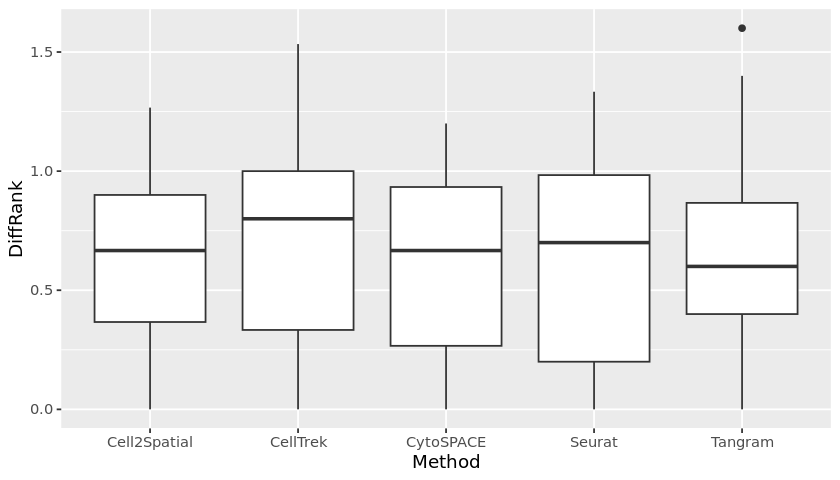

In [403]:
ggplot(plot.df, aes(x = Method, y = DiffRank)) + geom_boxplot()

In [360]:
table(plot.df$Method)


Cell2Spatial     CellTrek    CytoSPACE       Seurat      Tangram 
          31           31           31           31           31 

### Number of cell types projected

In [428]:
number.cts <- c(
    Reference = length(cell.colors),
    Cell2Spatial = unique(cell2spatial$CellType) %>% length, 
    CytoSPACE = unique(cytospace$CellType) %>% length, 
    CellTrek = unique(cell.trek$CellType) %>% length, 
    Tangram = unique(tangram$Ontology_ID) %>% length, 
    Seurat = unique(seurat.res$predicted.id) %>% length    
)
number.cts

Reference Cell2Spatial    CytoSPACE     CellTrek      Tangram       Seurat 
          31           31           20           31           31           15

png 
  2

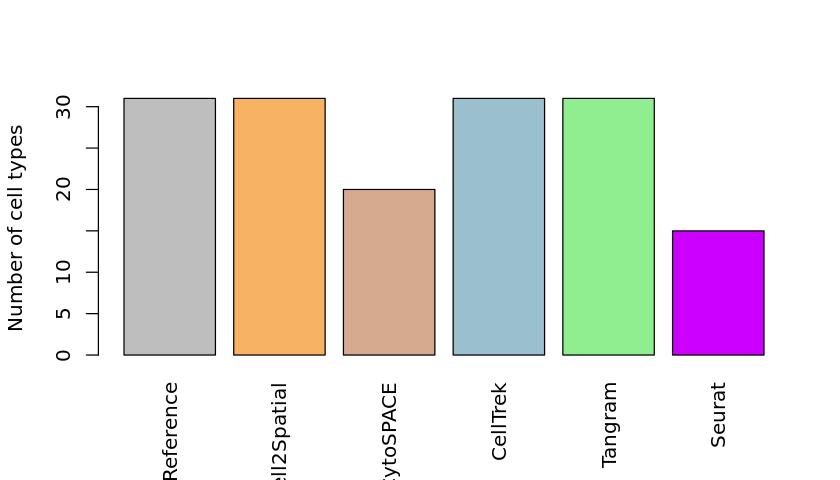

In [429]:
pdf(file.path(out.figs.dir, 'number.of.ctypes.pdf'), width = 6, height = 4)
bp <- barplot(number.cts, las = 3, ylab = 'Number of cell types', col = MTH_COLOR)
text(bp, 20, labels = round(number.cts, digits = 2))

dev.off()
barplot(number.cts, las = 3, ylab = 'Number of cell types', col = MTH_COLOR)